In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import cv2
from PIL import Image
import numpy as np

In [2]:
df = pd.read_csv('/kaggle/input/cleaned-clouddata/MultilabelClassification.csv')

In [3]:
df

,ImageFile,Fish,Flower,Gravel,Sugar
0,0011165.jpg,1,1,0,0
1,002be4f.jpg,1,1,0,1
2,0031ae9.jpg,1,1,0,1
3,0035239.jpg,0,1,1,0
4,003994e.jpg,1,0,1,1
...,...,...,...,...,...
5541,ffcedf2.jpg,1,0,0,0
5542,ffd11b6.jpg,0,1,0,1
5543,ffd3dfb.jpg,0,0,0,1
5544,ffd6680.jpg,0,1,1,0


In [4]:
import pandas as pd
sample_submission = pd.read_csv("../input/understanding_cloud_organization/sample_submission.csv")
train = pd.read_csv("../input/understanding_cloud_organization/train.csv")

In [5]:
images = list(os.listdir("/kaggle/input/understanding_cloud_organization/train_images/"))

In [6]:
len(images)

5546

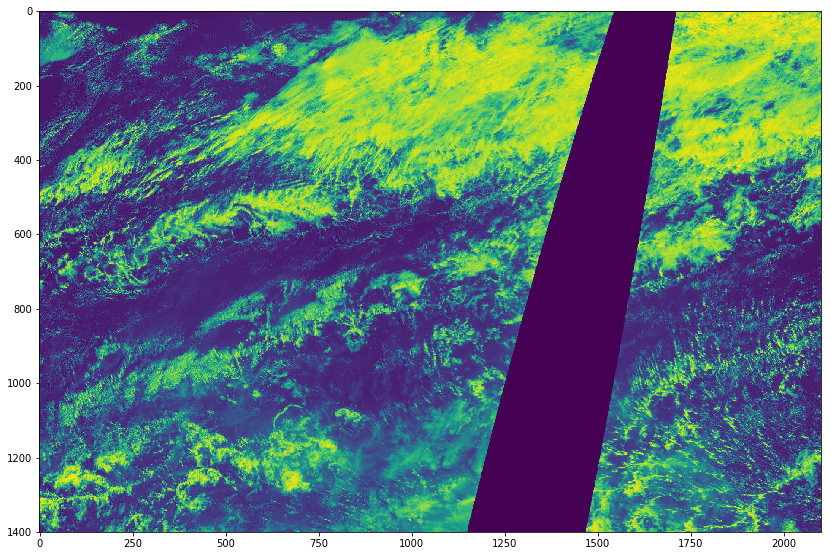

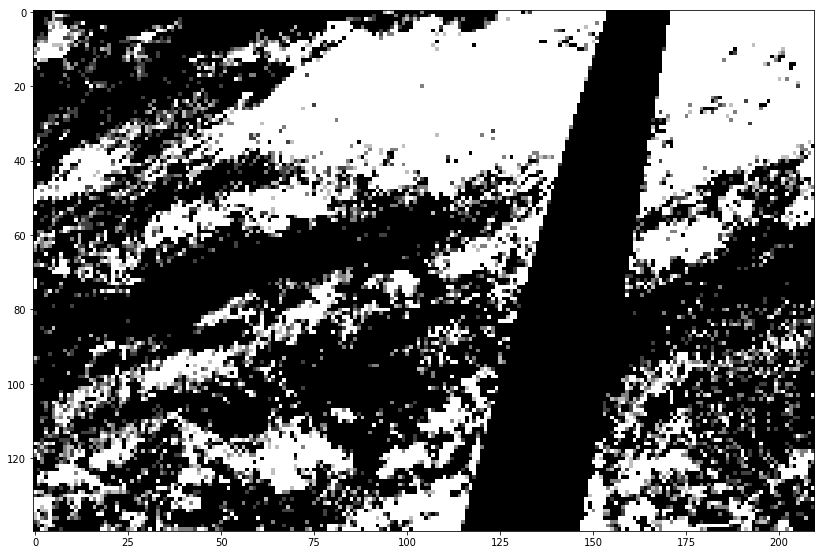

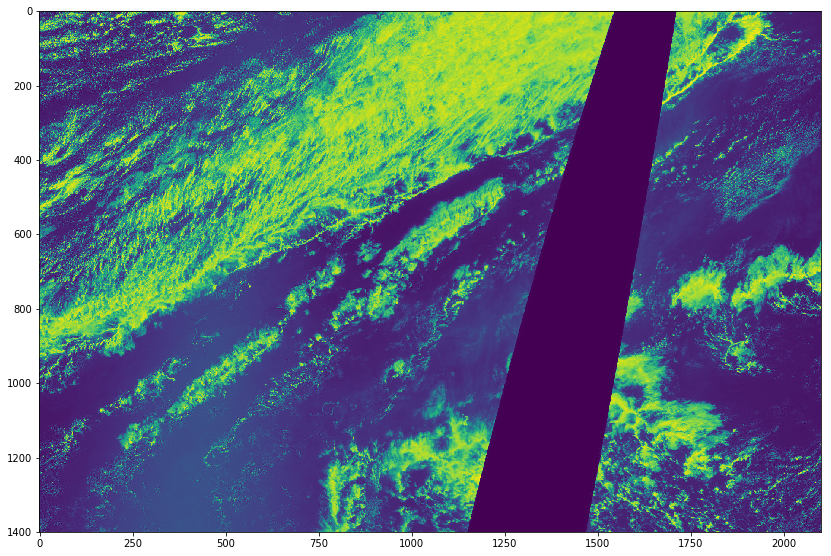

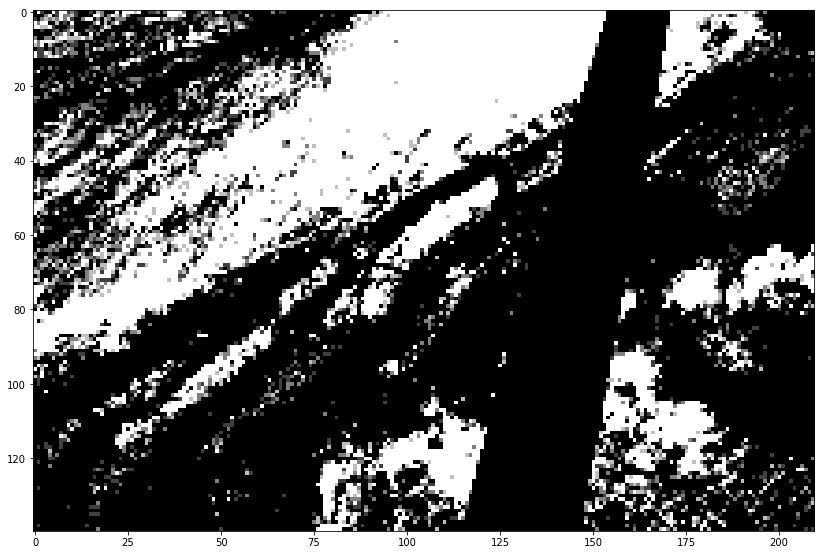

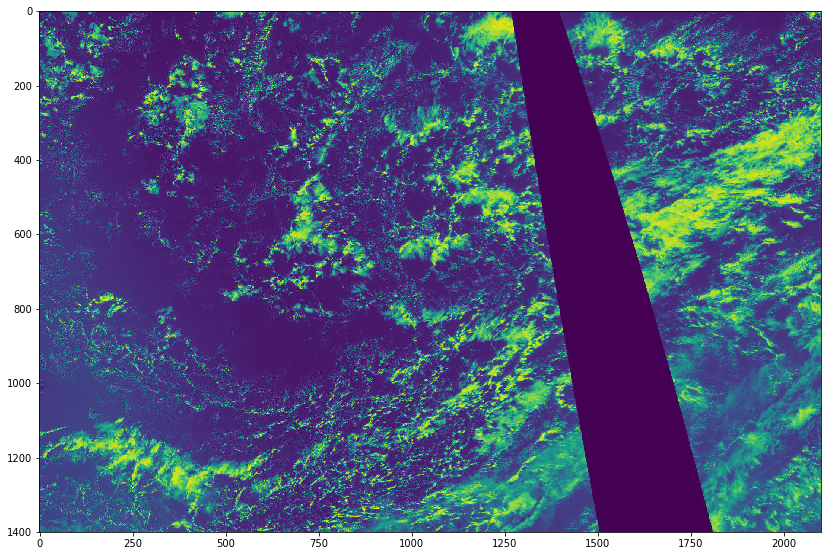

...

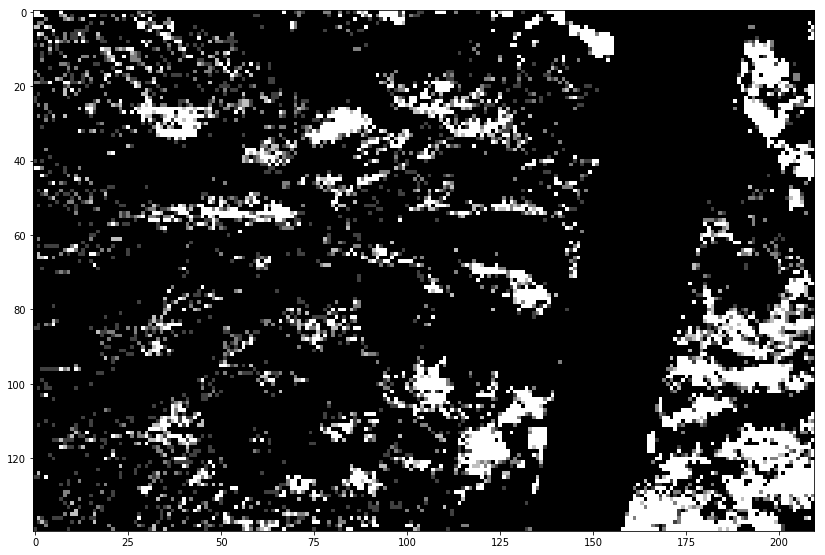

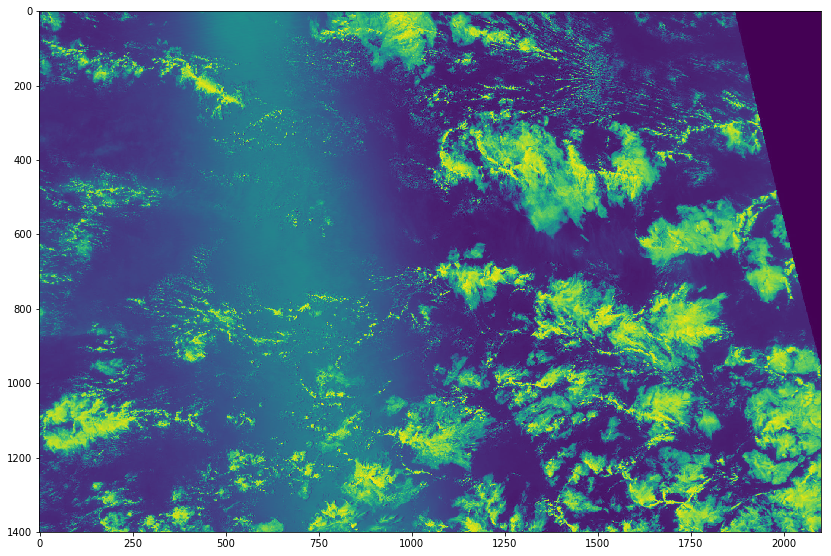

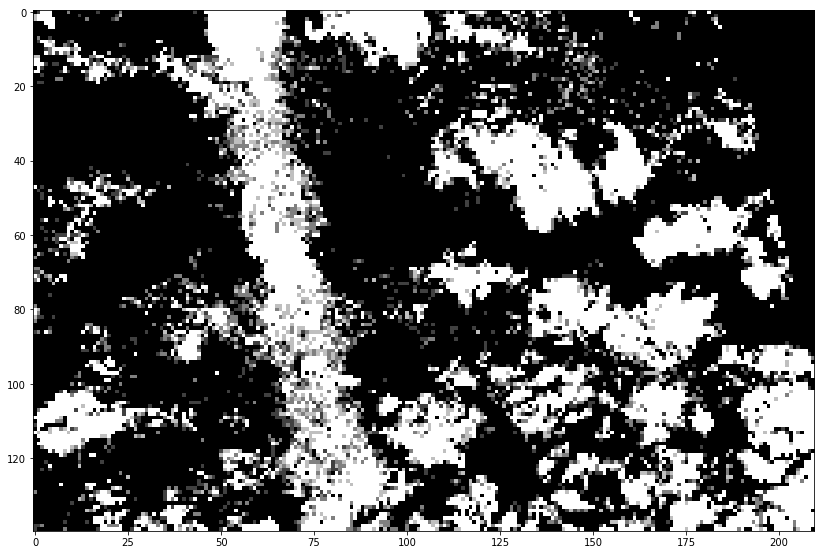

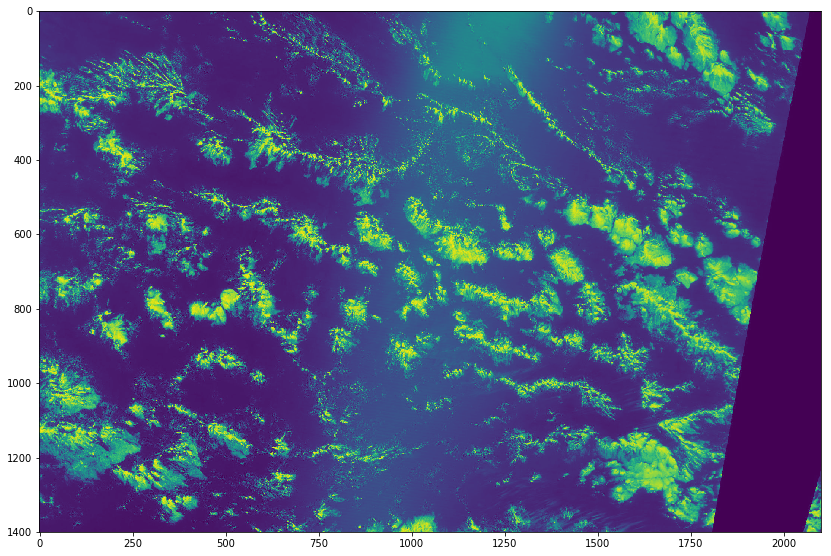

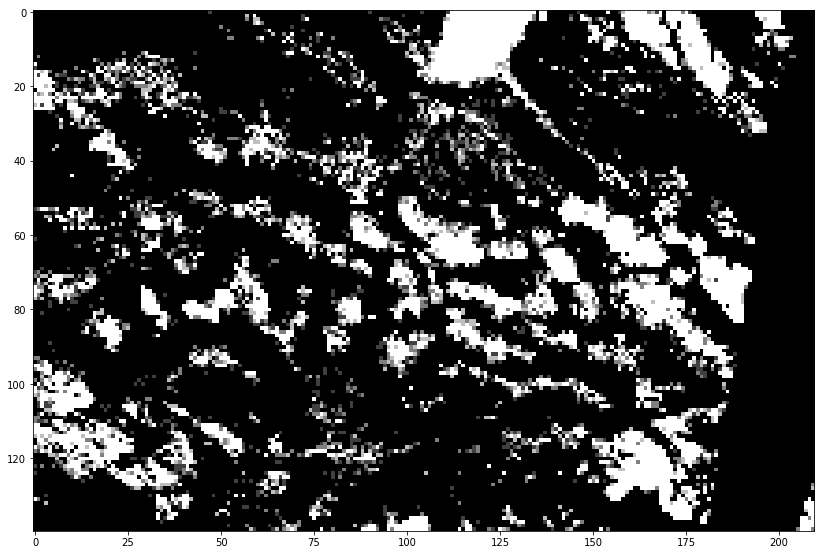

([array([0., 0., 0., ..., 0., 0., 0.]),
  array([0.        , 1.        , 0.25098039, ..., 0.25098039, 0.        ,
         0.25098039]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([1., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 1., 1., 1.]),
  array([1., 1., 0., ..., 0., 0., 0.]),
  array([0.        , 0.25098039, 1.        , ..., 1.        , 1.        ,
         0.        ]),
  array([0.        , 0.        , 0.        , ..., 1.        , 1.        ,
         0.50196078])],
 [[1, 0, 0, 1],
  [1, 0, 0, 1],
  [0, 0, 1, 1],
  [0, 0, 0, 1],
  [1, 1, 0, 1],
  [1, 1, 0, 1],
  [1, 0, 1, 0],
  [1, 0, 0, 1],
  [1, 1, 1, 1],
  [0, 1, 0, 0]])

In [7]:
#4500 images for training
#1046 images for testing
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

def read_images(batch_size,n,images,df,flag=0):
    x = []
    y = []
    if((n)>len(images)//batch_size):
        # invalid n
        return x , y
    # n- nth batch
    # batch_size = size of the batch being used.
    path='/kaggle/input/understanding_cloud_organization/train_images/'
    path_label = '/kaggle/input/cleaned-clouddata/'
    total_length_of_dataset = len(images)
    start = total_length_of_dataset - total_length_of_dataset // (n)
    end = start + batch_size
    for i in range(start,end):
        image=cv2.imread(path+'/'+images[i],0)# Reading the image
        #print(image.shape)
        ret, imgf = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        imgf=cv2.resize(imgf,(int(210),int(140)))
        imgD=np.asarray(imgf,dtype=np.float64)
        
        if(flag):
            plt.figure(figsize=(14,21))
            plt.imshow(np.asarray(image,dtype=np.float64))
            plt.show()
            plt.figure(figsize=(14,21))
            plt.imshow(imgD, cmap  =cm.gray)
            plt.show()
        #print(i)
        # Since there are errors with styles.csv, we need to extract only those images that have meta data.
        imgD /=255
        imgD = imgD.flatten()
        output = df[df['ImageFile'] == images[i]]
        if(len(output)):
            label = []
            output = output.reset_index(drop=True)
            label.append(output['Fish'][0])
            label.append(output['Flower'][0])
            label.append(output['Gravel'][0])
            label.append(output['Sugar'][0])
            x.append(imgD)
            y.append(label)
            #break
    return x,y
read_images(10,1,list(images),df,flag=1)

In [8]:
def read_data(images,df):
    x = []
    y = []
    path='/kaggle/input/understanding_cloud_organization/train_images/'
    #path_label = '/kaggle/input/cloud-multi-label-classification/'
    for i in range(len(images)):
        image = cv2.imread(path+'/'+images[i],0)# Reading the image
        ret,imgf = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        imgf=cv2.resize(imgf,(int(210),int(140)))
        imgD=np.asarray(imgf,dtype=np.float16)
        imgD /=255
        #print(imgD.shape)
        #imgD = imgD.flatten()
        output = df[df['ImageFile'] == images[i]]
        if(len(output)):
            label = []
            output = output.reset_index(drop=True)
            label.append(output['Fish'][0])
            label.append(output['Flower'][0])
            label.append(output['Gravel'][0])
            label.append(output['Sugar'][0])
            x.append(imgD)
            y.append(label)
    #print(x,y)
    return x,y

In [9]:
#tempx,tempy = read_data(train_images,df)

In [10]:
ar = np.array(tempx)
#np.array(tempx).shape
newdata = ar.reshape((len(tempx),140,210,1))
print(newdata.shape)

NameError: name 'tempx' is not defined

In [11]:
from keras import layers
from keras import models

Using TensorFlow backend.


In [12]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [13]:
model = models.Sequential()

model.add(layers.Conv2D(32,(3,3),strides=(1,1),activation='relu',input_shape=(140,210,1)))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64,(3,3),activation='relu'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64,(3,3),activation='relu'))
model.add(layers.MaxPooling2D(2,2))

model.add(layers.Flatten())

model.add(layers.Dense(128,activation='relu'))
model.add(layers.Dense(4,activation='sigmoid'))

In [14]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',f1_m,precision_m,recall_m])

In [15]:
#train test split
import random
import time
images = set(images)
train_images = list(random.sample(images,4500))
batch_size = 180
epochs = 10
test_images = list(images.difference(train_images))
overall = dict()

In [16]:
len(test_images)

1046

In [17]:
x_train,y_train = read_data(train_images,df)

In [18]:
xt = np.array(x_train)
yt = np.array(y_train)

newdataX = xt.reshape((len(x_train),140,210,1))
print(newdataX.shape)

(4500, 140, 210, 1)


In [19]:
xt.shape

(4500, 140, 210)

In [20]:
model.fit(newdataX,yt,epochs=10,batch_size=180,verbose=1)

Epoch 1/10
4500/4500 [==============================] - 5s 1ms/step - loss: 0.6994 - accuracy: 0.5438 - f1_m: 0.4454 - precision_m: 0.5884 - recall_m: 0.4159
Epoch 2/10
4500/4500 [==============================] - 3s 558us/step - loss: 0.6701 - accuracy: 0.5719 - f1_m: 0.6208 - precision_m: 0.5886 - recall_m: 0.6665
Epoch 3/10
4500/4500 [==============================] - 3s 560us/step - loss: 0.6359 - accuracy: 0.6284 - f1_m: 0.6748 - precision_m: 0.6330 - recall_m: 0.7283
Epoch 4/10
4500/4500 [==============================] - 2s 554us/step - loss: 0.6051 - accuracy: 0.6659 - f1_m: 0.7031 - precision_m: 0.6694 - recall_m: 0.7500
Epoch 5/10
4500/4500 [==============================] - 3s 561us/step - loss: 0.5715 - accuracy: 0.7014 - f1_m: 0.7261 - precision_m: 0.7115 - recall_m: 0.7430
Epoch 6/10
4500/4500 [==============================] - 3s 558us/step - loss: 0.5518 - accuracy: 0.7146 - f1_m: 0.7395 - precision_m: 0.7221 - recall_m: 0.7597
Epoch 7/10
4500/4500 [====================

In [21]:
#model.save('/kaggle/working/cnn_10.h5')

In [22]:
x_test,y_test = read_data(test_images,df)

In [23]:
xtest = np.array(x_test)
ytest = np.array(y_test)

newdataXtest = xtest.reshape((len(x_test),140,210,1))
print(newdataXtest.shape)

(1046, 140, 210, 1)


In [24]:
[loss, acc] = model.evaluate(newdataXtest,ytest,verbose=1)
print("Accuracy:" + str(acc))

1046/1046 [==============================] - 1s 501us/step


ValueError: too many values to unpack (expected 2)

In [25]:
print('Training Accuracy')
a=model.evaluate(newdataX,yt)
print(list(a))
print('Loss: {} \nAccuracy: {} \nF-1 Score: {} \nRecall: {} \nPrecision: {}'.format(a[0],a[1],a[2],a[3],a[4]))

Training Accuracy
4500/4500 [==============================] - 2s 362us/step
[0.40435798406600953, 0.8247777819633484, 0.8369423747062683, 0.8270425200462341, 0.8489580750465393]
Loss: 0.40435798406600953 
Accuracy: 0.8247777819633484 
F-1 Score: 0.8369423747062683 
Recall: 0.8270425200462341 
Precision: 0.8489580750465393


In [26]:
print('Testing Accuracy')
a=model.evaluate(newdataXtest,ytest)
print(list(a))
print('Loss: {} \nAccuracy: {} \nF-1 Score: {} \nRecall: {} \nPrecision: {}'.format(a[0],a[1],a[2],a[3],a[4]))

Testing Accuracy
1046/1046 [==============================] - 0s 345us/step
[0.6395056492739836, 0.6579827666282654, 0.6881203055381775, 0.6674483418464661, 0.7122346758842468]
Loss: 0.6395056492739836 
Accuracy: 0.6579827666282654 
F-1 Score: 0.6881203055381775 
Recall: 0.6674483418464661 
Precision: 0.7122346758842468
